In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from sklearn.utils import resample
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
from sklearn import svm
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from scipy import stats
import xgboost as xgb
from xgboost import XGBClassifier
%matplotlib inline 
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
import gc
from datetime import datetime 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

In [9]:
identity = pd.read_csv("C:/Users/askma/OneDrive/Desktop/Spring_mid_term/Spring_mid_term/identity.csv")
transact = pd.read_csv("C:/Users/askma/OneDrive/Desktop/Spring_mid_term/Spring_mid_term/transaction.csv")

We are using the constants below for the entirety of the notebook

In [10]:
SEED = 42
TARGET = 'isFraud'

In [11]:
identity.shape

(144233, 41)

In [12]:
transact.shape

(590540, 394)

In [13]:
identity.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144233 entries, 0 to 144232
Data columns (total 41 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   TransactionID  144233 non-null  int64  
 1   id_01          144233 non-null  float64
 2   id_02          140872 non-null  float64
 3   id_03          66324 non-null   float64
 4   id_04          66324 non-null   float64
 5   id_05          136865 non-null  float64
 6   id_06          136865 non-null  float64
 7   id_07          5155 non-null    float64
 8   id_08          5155 non-null    float64
 9   id_09          74926 non-null   float64
 10  id_10          74926 non-null   float64
 11  id_11          140978 non-null  float64
 12  id_12          144233 non-null  object 
 13  id_13          127320 non-null  float64
 14  id_14          80044 non-null   float64
 15  id_15          140985 non-null  object 
 16  id_16          129340 non-null  object 
 17  id_17          139369 non-nul

In [14]:
transact.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 590540 entries, 0 to 590539
Columns: 394 entries, TransactionID to V339
dtypes: float64(376), int64(4), object(14)
memory usage: 1.7+ GB


This is how we will be merging our data

In [15]:
df = pd.merge(identity, transact, on='TransactionID', how='left')
df.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
df.shape

(144233, 434)

In [17]:
l = df.columns
l

Index(['TransactionID', 'id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06',
       'id_07', 'id_08', 'id_09',
       ...
       'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338',
       'V339'],
      dtype='object', length=434)

In [18]:
for i in range(434):
    print(l[i])

TransactionID
id_01
id_02
id_03
id_04
id_05
id_06
id_07
id_08
id_09
id_10
id_11
id_12
id_13
id_14
id_15
id_16
id_17
id_18
id_19
id_20
id_21
id_22
id_23
id_24
id_25
id_26
id_27
id_28
id_29
id_30
id_31
id_32
id_33
id_34
id_35
id_36
id_37
id_38
DeviceType
DeviceInfo
isFraud
TransactionDT
TransactionAmt
ProductCD
card1
card2
card3
card4
card5
card6
addr1
addr2
dist1
dist2
P_emaildomain
R_emaildomain
C1
C2
C3
C4
C5
C6
C7
C8
C9
C10
C11
C12
C13
C14
D1
D2
D3
D4
D5
D6
D7
D8
D9
D10
D11
D12
D13
D14
D15
M1
M2
M3
M4
M5
M6
M7
M8
M9
V1
V2
V3
V4
V5
V6
V7
V8
V9
V10
V11
V12
V13
V14
V15
V16
V17
V18
V19
V20
V21
V22
V23
V24
V25
V26
V27
V28
V29
V30
V31
V32
V33
V34
V35
V36
V37
V38
V39
V40
V41
V42
V43
V44
V45
V46
V47
V48
V49
V50
V51
V52
V53
V54
V55
V56
V57
V58
V59
V60
V61
V62
V63
V64
V65
V66
V67
V68
V69
V70
V71
V72
V73
V74
V75
V76
V77
V78
V79
V80
V81
V82
V83
V84
V85
V86
V87
V88
V89
V90
V91
V92
V93
V94
V95
V96
V97
V98
V99
V100
V101
V102
V103
V104
V105
V106
V107
V108
V109
V110
V111
V112
V113
V114
V115
V116
V117

This is a heatmap of all the null values

<AxesSubplot:>

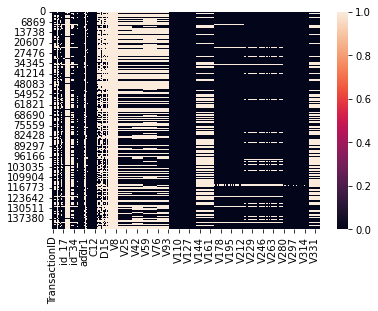

In [11]:
sns.heatmap(df.isna())

This shows the sum of all null values within a column

In [72]:
df.isna().sum()

TransactionID        0
id_01                0
id_02             3361
id_03            77909
id_04            77909
                 ...  
V335             62192
V336             62192
V337             62192
V338             62192
V339             62192
Length: 434, dtype: int64

In [73]:
df.shape[0]//2

72116

We are dropping all columns that have more than 50% null values within them

In [19]:
c=0
for i in range(df.shape[1]):
    if(df[l[i]].isna().sum() > df.shape[0]//2):
        df.drop([l[i]],axis=1,inplace = True)
        print("dropping ",l[i]," !!!! ")
        c=c+1
print(c," columns dropped !!! ")

dropping  id_03  !!!! 
dropping  id_04  !!!! 
dropping  id_07  !!!! 
dropping  id_08  !!!! 
dropping  id_18  !!!! 
dropping  id_21  !!!! 
dropping  id_22  !!!! 
dropping  id_23  !!!! 
dropping  id_24  !!!! 
dropping  id_25  !!!! 
dropping  id_26  !!!! 
dropping  id_27  !!!! 
dropping  dist1  !!!! 
dropping  dist2  !!!! 
dropping  D2  !!!! 
dropping  D3  !!!! 
dropping  D4  !!!! 
dropping  D5  !!!! 
dropping  D6  !!!! 
dropping  D7  !!!! 
dropping  D10  !!!! 
dropping  D11  !!!! 
dropping  D12  !!!! 
dropping  D13  !!!! 
dropping  D14  !!!! 
dropping  D15  !!!! 
dropping  M1  !!!! 
dropping  M2  !!!! 
dropping  M3  !!!! 
dropping  M4  !!!! 
dropping  M5  !!!! 
dropping  M6  !!!! 
dropping  M7  !!!! 
dropping  M8  !!!! 
dropping  M9  !!!! 
dropping  V1  !!!! 
dropping  V2  !!!! 
dropping  V3  !!!! 
dropping  V4  !!!! 
dropping  V5  !!!! 
dropping  V6  !!!! 
dropping  V7  !!!! 
dropping  V8  !!!! 
dropping  V9  !!!! 
dropping  V10  !!!! 
dropping  V11  !!!! 
dropping  V12  !!!! 
dropping 

In [20]:
df.shape

(144233, 305)

All the columns that we have not dropped and have some null values within them

In [21]:
nl = df.columns[df.isna().any()].tolist()
nl

['id_02',
 'id_05',
 'id_06',
 'id_09',
 'id_10',
 'id_11',
 'id_13',
 'id_14',
 'id_15',
 'id_16',
 'id_17',
 'id_19',
 'id_20',
 'id_28',
 'id_29',
 'id_30',
 'id_31',
 'id_32',
 'id_33',
 'id_34',
 'id_35',
 'id_36',
 'id_37',
 'id_38',
 'DeviceType',
 'DeviceInfo',
 'card2',
 'card3',
 'card4',
 'card5',
 'card6',
 'addr1',
 'addr2',
 'P_emaildomain',
 'R_emaildomain',
 'D1',
 'D8',
 'D9',
 'V95',
 'V96',
 'V97',
 'V98',
 'V99',
 'V100',
 'V101',
 'V102',
 'V103',
 'V104',
 'V105',
 'V106',
 'V107',
 'V108',
 'V109',
 'V110',
 'V111',
 'V112',
 'V113',
 'V114',
 'V115',
 'V116',
 'V117',
 'V118',
 'V119',
 'V120',
 'V121',
 'V122',
 'V123',
 'V124',
 'V125',
 'V126',
 'V127',
 'V128',
 'V129',
 'V130',
 'V131',
 'V132',
 'V133',
 'V134',
 'V135',
 'V136',
 'V137',
 'V138',
 'V139',
 'V140',
 'V141',
 'V142',
 'V143',
 'V144',
 'V145',
 'V146',
 'V147',
 'V148',
 'V149',
 'V150',
 'V151',
 'V152',
 'V153',
 'V154',
 'V155',
 'V156',
 'V157',
 'V158',
 'V159',
 'V160',
 'V161',
 'V16

This loop will fill all the null values in the remaining columns

In [22]:
for i in range(len(nl)):
    df[nl[i]] = df[nl[i]].fillna(df[nl[i]].mode()[0])

In [23]:
df.columns[df.isna().any()].tolist()

[]

In [24]:
df.head()

,TransactionID,id_01,id_02,id_05,id_06,id_09,id_10,id_11,id_12,id_13,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987004,0.0,70787.0,0.0,0.0,0.0,0.0,100.0,NotFound,52.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2987008,-5.0,98945.0,0.0,-5.0,0.0,0.0,100.0,NotFound,49.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,100.0,NotFound,52.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2987011,-5.0,221832.0,0.0,-6.0,0.0,0.0,100.0,NotFound,52.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2987016,0.0,7460.0,1.0,0.0,0.0,0.0,100.0,NotFound,52.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
df.shape

(144233, 305)

Encoding categorical values

In [27]:
def get_cat_col(df):
    main_col = df.columns
    num_col = df._get_numeric_data().columns
    cat_col = list(set(main_col) - set(num_col))
    return cat_col

In [28]:
catcol = get_cat_col(df)
catcol

['id_38',
 'id_30',
 'id_36',
 'id_16',
 'R_emaildomain',
 'id_33',
 'id_31',
 'ProductCD',
 'id_12',
 'id_35',
 'DeviceType',
 'id_15',
 'id_37',
 'DeviceInfo',
 'card6',
 'card4',
 'P_emaildomain',
 'id_29',
 'id_34',
 'id_28']

In [29]:
le = LabelEncoder()

In [30]:
for i in range(len(catcol)):
    df[catcol[i]] = le.fit_transform(df[catcol[i]])

In [31]:
get_cat_col(df)

[]

In [32]:
df.shape

(144233, 305)

In [33]:
y = df['isFraud']
y

0         0
1         0
2         0
3         0
4         0
         ..
144228    0
144229    1
144230    0
144231    0
144232    0
Name: isFraud, Length: 144233, dtype: int64

Calculation and graphs to show how many cases are fraudulent and how many are not

In [34]:
y.value_counts()

0    132915
1     11318
Name: isFraud, dtype: int64

<AxesSubplot:>

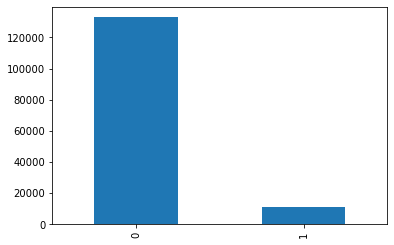

In [35]:
y.value_counts().plot(kind = 'bar')

In [36]:
#class imbalance - fix by resampling new data

In [37]:
df_one = df[(df['isFraud']==1)]
df_one.shape

(11318, 305)

In [38]:
df_zero = df[(df['isFraud']==0)]
df_zero.shape

(132915, 305)

In [39]:
len(df_zero)

132915

In [40]:
new_df= resample(df_one,replace = True,n_samples=132915,random_state = 42)

In [41]:
new_df.shape

(132915, 305)

In [42]:
df= pd.concat([new_df,df_zero])
df.shape

(265830, 305)

Checking for null values after resampling

In [44]:
nl = df.columns[df.isna().any()].tolist()
nl

[]

In [45]:
for i in range(len(nl)):
    df[nl[i]] = df[nl[i]].fillna(df[nl[i]].mode()[0])

In [46]:
df.columns[df.isna().any()].tolist()

[]

In [47]:
y = df['isFraud']
y

103980    1
21743     1
85879     1
84178     1
143989    1
         ..
144227    0
144228    0
144230    0
144231    0
144232    0
Name: isFraud, Length: 265830, dtype: int64

<AxesSubplot:>

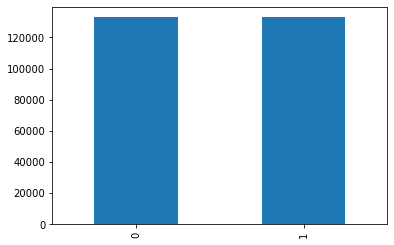

In [48]:
y.value_counts().plot(kind = 'bar')

Just EDA to see what columns may have a strong correlation with Fraud, in this case we choose TransactionDT but this view is skewed as the trasactionDT is not in hours

In [52]:
Vcount = df.loc[df['isFraud'] == 0]["TransactionDT"]
Fcount = df.loc[df['isFraud'] == 1]["TransactionDT"]

hist_data = [Vcount, Fcount]
group_labels = ['Not Fraud', 'Fraud']

fig = ff.create_distplot(hist_data, group_labels, show_hist=False, show_rug=False)
iplot(fig, filename='dist_only')

More EDA and we see that TransactionAmt does have a correlation with Fraud

In [53]:
Vcount = df.loc[df['isFraud'] == 0]["TransactionAmt"]
Fcount = df.loc[df['isFraud'] == 1]["TransactionAmt"]

hist_data = [Vcount, Fcount]
group_labels = ['Not Fraud', 'Fraud']

fig = ff.create_distplot(hist_data, group_labels, show_hist=False, show_rug=False)
iplot(fig, filename='dist_only')

The below function helps us plot EDA graphs much more easily

In [54]:
def plot_numeric_data(data, col, target_col, remove_outliers = False):
   
    data = data[[col, target_col]].copy()
    data.dropna(subset=[col], inplace =True)
    
    sns.distplot(data[data[target_col] == 0][col], color = 'b', label = 'NotFraud')
    plt.legend()
    sns.distplot(data[data[target_col] == 1][col], color = 'r', label = 'Fraud')
    plt.legend()
    plt.show()

Here we create a function to change TrasactionDT into hours

In [57]:
def make_hour_feature(df, tname='TransactionDT'): 
   
    hours = df[tname]/(3600)        
    encoded_hours = np.floor(hours) % 24
    return encoded_hours

C:\Users\askma\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\askma\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



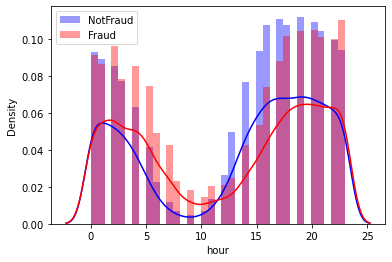

In [56]:
col = 'hour'
df[col] = make_hour_feature(df)

plot_numeric_data(df,col,TARGET,remove_outliers = True)

Below we have created a sctterplot of Fraud on transactionDT and trasactionAmt for EDA purposes and see that a lot of Fraud cases are low in amount over the entire course of the time

In [58]:
fraud = df.loc[df['isFraud'] == 1]

trace = go.Scatter(
    x = fraud['TransactionDT'],y = fraud['TransactionAmt'],name="Amount",text= fraud['TransactionAmt'],mode = "markers")
data = [trace]
layout = dict(title = 'Fraudulent transactions',xaxis = dict(title = 'Time [s]', showticklabels=True), 
              yaxis = dict(title = 'Amount'),hovermode='closest')
fig = dict(data=data, layout=layout)
iplot(fig, filename='fraud-amount')

We now drop the Fraud column and other categorical/qualitative columns from here onwards

In [61]:
df.drop(['isFraud'],axis=1,inplace=True)

In [62]:
X = df.copy()
X.shape

(265830, 305)

In [63]:
#Feature Engineering

Below is a simpler way to formulate transactionDT to hours

In [64]:
hours = df['TransactionDT']/(3600)
hours

103980    2709.076111
21743      394.457222
85879     1919.535278
84178     1853.196944
143989    4384.386111
             ...     
144227    4391.803056
144228    4391.889444
144230    4391.920000
144231    4391.926389
144232    4391.952778
Name: TransactionDT, Length: 265830, dtype: float64

We have encoded the hours column from the above mentioned

In [65]:
encoded_hours = np.floor(hours) % 24
encoded_hours

103980    21.0
21743     10.0
85879     23.0
84178      5.0
143989    16.0
          ... 
144227    23.0
144228    23.0
144230    23.0
144231    23.0
144232    23.0
Name: TransactionDT, Length: 265830, dtype: float64

In [66]:
df['hour'] = encoded_hours
df['hour']

103980    21.0
21743     10.0
85879     23.0
84178      5.0
143989    16.0
          ... 
144227    23.0
144228    23.0
144230    23.0
144231    23.0
144232    23.0
Name: hour, Length: 265830, dtype: float64

In [67]:
#Feature importance

These are now the columns we are working with in our new modified dataframe and modied attributes

In [68]:
l=X.columns
l

Index(['TransactionID', 'id_01', 'id_02', 'id_05', 'id_06', 'id_09', 'id_10',
       'id_11', 'id_12', 'id_13',
       ...
       'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339',
       'hour'],
      dtype='object', length=305)

We use linerRegresion to start getting coefficients to see even more correlation between the columns

In [69]:
lmod = LinearRegression()
lmod.fit(X,y)

LinearRegression()

In [70]:
lmod.coef_

array([ 3.81886708e-06, -2.65537998e-03, -2.14272006e-07,  1.92084082e-03,
       -1.78074248e-04,  2.26776743e-02, -6.40658561e-03,  2.39184273e-02,
       -9.44647849e-03, -2.96362431e-04,  3.29376931e-04,  5.22090217e-02,
        4.32579966e-02,  1.40380099e-03, -4.66234630e-06,  1.22177135e-05,
        5.33531795e-02, -3.04788216e-01, -1.49973511e-03, -8.10272821e-04,
        2.66808689e-03, -2.50205047e-04, -3.98795097e-02, -4.44078406e-02,
       -2.09817459e-02, -3.91550267e-04,  6.27513336e-02,  9.89155134e-02,
        7.32303187e-05, -1.27060787e-07,  6.85530090e-04, -4.71028154e-02,
       -3.04058163e-06, -1.61601825e-04,  3.07107371e-03,  1.44966532e-02,
       -3.82236907e-05, -9.99033675e-02,  4.95129355e-05, -1.57482469e-03,
       -1.16030129e-03,  9.73312810e-04,  9.00547424e-04, -1.67524633e-03,
       -1.65969890e-02,  2.08127854e-02, -3.25551394e-09, -2.14154240e-02,
        8.16832597e-03, -3.91413401e-04, -2.12415343e-08,  2.24269487e-03,
        1.49118010e-02, -

Here we will drop all columns where the correlation coefficient was less than 0

In [71]:
for i,v in enumerate(lmod.coef_):
    #print("Importance of ",i," feature is:-",v)
    if(v<0):
        X.drop([l[i]],axis=1,inplace = True)
        print(l[i],"Dropped!!")

id_01 Dropped!!
id_02 Dropped!!
id_06 Dropped!!
id_10 Dropped!!
id_12 Dropped!!
id_13 Dropped!!
id_19 Dropped!!
id_29 Dropped!!
id_30 Dropped!!
id_31 Dropped!!
id_33 Dropped!!
id_34 Dropped!!
id_35 Dropped!!
id_36 Dropped!!
id_37 Dropped!!
TransactionDT Dropped!!
ProductCD Dropped!!
card1 Dropped!!
card2 Dropped!!
card5 Dropped!!
card6 Dropped!!
addr2 Dropped!!
P_emaildomain Dropped!!
C2 Dropped!!
C3 Dropped!!
C5 Dropped!!
C6 Dropped!!
C8 Dropped!!
C9 Dropped!!
C12 Dropped!!
C14 Dropped!!
D1 Dropped!!
D8 Dropped!!
D9 Dropped!!
V96 Dropped!!
V97 Dropped!!
V98 Dropped!!
V101 Dropped!!
V104 Dropped!!
V105 Dropped!!
V110 Dropped!!
V112 Dropped!!
V114 Dropped!!
V116 Dropped!!
V118 Dropped!!
V121 Dropped!!
V124 Dropped!!
V126 Dropped!!
V130 Dropped!!
V131 Dropped!!
V133 Dropped!!
V134 Dropped!!
V137 Dropped!!
V139 Dropped!!
V142 Dropped!!
V144 Dropped!!
V147 Dropped!!
V148 Dropped!!
V150 Dropped!!
V152 Dropped!!
V153 Dropped!!
V156 Dropped!!
V158 Dropped!!
V160 Dropped!!
V161 Dropped!!
V163 

In [72]:
X.shape

(265830, 156)

In [73]:
#splitting train and test data

Here we have split the training and testing data into the 80-20 split

In [74]:
X_train,X_test,y_train,y_test = train_test_split(X,y,train_size=0.8)

In [75]:
print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

(212664, 156) (53166, 156) (212664,) (53166,)


In [76]:
#Using Xgboost

In [77]:
mod = XGBClassifier(max_depth= 7, min_child_weight= 1, n_estimators= 100)

In [78]:
mod.fit(X_train,y_train)

C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[18:42:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=7, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [79]:
xpred = mod.predict(X_test)
xpred

array([1, 0, 1, ..., 0, 1, 1], dtype=int64)

In [80]:
print(accuracy_score(xpred,y_test))

0.9530150848286499


In [81]:
print(classification_report(xpred,y_test))

              precision    recall  f1-score   support

           0       0.96      0.95      0.95     26764
           1       0.95      0.96      0.95     26402

    accuracy                           0.95     53166
   macro avg       0.95      0.95      0.95     53166
weighted avg       0.95      0.95      0.95     53166



In [82]:
#Hyperparameter tuning

In [83]:
param_grid = {'max_depth':[3,5,7], 'min_child_weight': [1,3,5]}

In [84]:
model = GridSearchCV(mod, param_grid, 
                     scoring='accuracy', verbose=3)

In [85]:
model.fit(X_train,y_train,eval_metric='auc')

Fitting 5 folds for each of 9 candidates, totalling 45 fits


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 1/5] END ................max_depth=3, min_child_weight=1; total time=  13.7s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 2/5] END ................max_depth=3, min_child_weight=1; total time=  15.0s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 3/5] END ................max_depth=3, min_child_weight=1; total time=  17.2s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 4/5] END ................max_depth=3, min_child_weight=1; total time=  17.3s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 5/5] END ................max_depth=3, min_child_weight=1; total time=  16.3s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 1/5] END ................max_depth=3, min_child_weight=3; total time=  16.5s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 2/5] END ................max_depth=3, min_child_weight=3; total time=  16.8s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 3/5] END ................max_depth=3, min_child_weight=3; total time=  18.6s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 4/5] END ................max_depth=3, min_child_weight=3; total time=  17.8s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 5/5] END ................max_depth=3, min_child_weight=3; total time=  18.4s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 1/5] END ................max_depth=3, min_child_weight=5; total time=  17.3s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 2/5] END ................max_depth=3, min_child_weight=5; total time=  17.8s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 3/5] END ................max_depth=3, min_child_weight=5; total time=  17.3s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 4/5] END ................max_depth=3, min_child_weight=5; total time=  17.7s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 5/5] END ................max_depth=3, min_child_weight=5; total time=  17.3s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 1/5] END ................max_depth=5, min_child_weight=1; total time=  28.0s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 2/5] END ................max_depth=5, min_child_weight=1; total time=  27.7s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 3/5] END ................max_depth=5, min_child_weight=1; total time=  27.3s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 4/5] END ................max_depth=5, min_child_weight=1; total time=  27.1s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 5/5] END ................max_depth=5, min_child_weight=1; total time=  27.0s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 1/5] END ................max_depth=5, min_child_weight=3; total time=  30.1s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 2/5] END ................max_depth=5, min_child_weight=3; total time=  27.7s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 3/5] END ................max_depth=5, min_child_weight=3; total time=  26.8s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 4/5] END ................max_depth=5, min_child_weight=3; total time=  26.9s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 5/5] END ................max_depth=5, min_child_weight=3; total time=  28.7s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 1/5] END ................max_depth=5, min_child_weight=5; total time=  27.3s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 2/5] END ................max_depth=5, min_child_weight=5; total time=  27.5s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 3/5] END ................max_depth=5, min_child_weight=5; total time=  26.7s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 4/5] END ................max_depth=5, min_child_weight=5; total time=  27.6s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 5/5] END ................max_depth=5, min_child_weight=5; total time=  28.2s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 1/5] END ................max_depth=7, min_child_weight=1; total time=  38.0s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 2/5] END ................max_depth=7, min_child_weight=1; total time=  38.2s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 3/5] END ................max_depth=7, min_child_weight=1; total time=  38.4s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 4/5] END ................max_depth=7, min_child_weight=1; total time=  37.0s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 5/5] END ................max_depth=7, min_child_weight=1; total time=  37.3s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 1/5] END ................max_depth=7, min_child_weight=3; total time=  37.8s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 2/5] END ................max_depth=7, min_child_weight=3; total time=  38.0s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 3/5] END ................max_depth=7, min_child_weight=3; total time=  37.9s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 4/5] END ................max_depth=7, min_child_weight=3; total time=  38.7s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 5/5] END ................max_depth=7, min_child_weight=3; total time=  39.4s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 1/5] END ................max_depth=7, min_child_weight=5; total time=  36.5s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 2/5] END ................max_depth=7, min_child_weight=5; total time=  39.1s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 3/5] END ................max_depth=7, min_child_weight=5; total time=  36.8s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 4/5] END ................max_depth=7, min_child_weight=5; total time=  37.4s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[CV 5/5] END ................max_depth=7, min_child_weight=5; total time=  37.6s


C:\Users\askma\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



GridSearchCV(estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1,
                                     enable_categorical=False, gamma=0,
                                     gpu_id=-1, importance_type=None,
                                     interaction_constraints='',
                                     learning_rate=0.300000012,
                                     max_delta_step=0, max_depth=7,
                                     min_child_weight=1, missing=nan,
                                     monotone_constraints='()',
                                     n_estimators=100, n_jobs=8,
                                     num_parallel_tree=1, predictor='auto',
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, subsample=1,
                              

In [87]:
print(model.best_params_)

{'max_depth': 7, 'min_child_weight': 1}
